##**EDA**

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import optuna
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from lightgbm import early_stopping, log_evaluation
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
import joblib

/Users/SHAD/.pyenv/versions/3.10.6/envs/peaklytics/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df = pd.read_csv('/Users/SHAD/code/Parvxi/Peaklytics/raw_data/Peaklytics_intial_data.csv')
df.head()

,Unnamed: 0,name,market,funding_total_usd,status,region,city,funding_rounds,founded_at,founded_month,...,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country,quater
0,0,#waywire,News,1750000.0,acquired,New York City,New York,1.0,2012-06-01,2012-06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Q2
1,2,'Rock' Your Paper,Publishing,40000.0,operating,Tallinn,Tallinn,1.0,2012-10-26,2012-10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Estonia,Q4
2,3,(In)Touch Network,Electronics,1500000.0,operating,London,London,1.0,2011-04-01,2011-04,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United Kingdom,Q2
3,4,-R- Ranch and Mine,Tourism,60000.0,operating,Dallas,Fort Worth,2.0,2014-01-01,2014-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Q1
4,10,"1,2,3 Listo",E-Commerce,40000.0,operating,Santiago,Las Condes,1.0,2012-01-01,2012-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Chile,Q1


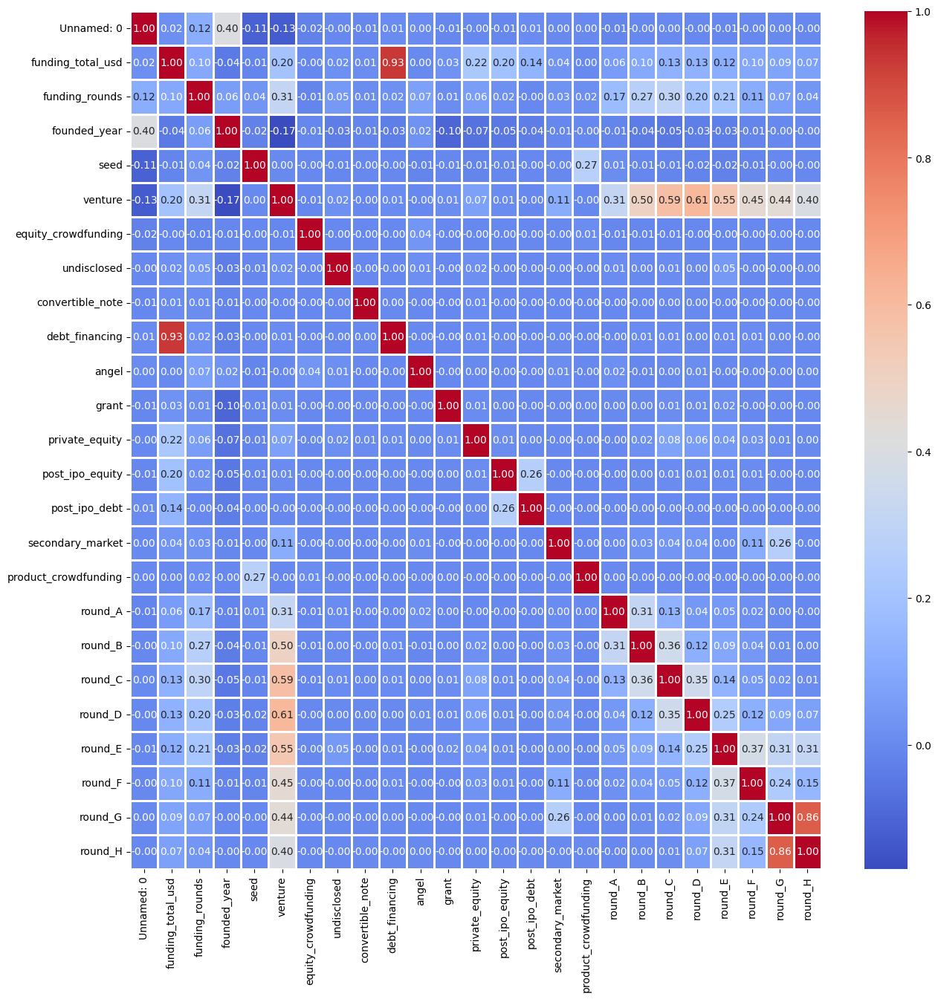

In [3]:
numerical_columns = df.select_dtypes(include=[np.number]).columns

corr_matrix = df[numerical_columns].corr()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.8, fmt='.2f', ax=ax)
plt.show()

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43268 entries, 0 to 43267
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            43268 non-null  int64  
 1   name                  43268 non-null  object 
 2   market                43268 non-null  object 
 3   funding_total_usd     43268 non-null  float64
 4   status                43268 non-null  object 
 5   region                43268 non-null  object 
 6   city                  43268 non-null  object 
 7   funding_rounds        43268 non-null  float64
 8   founded_at            43268 non-null  object 
 9   founded_month         43268 non-null  object 
 10  founded_quarter       43268 non-null  object 
 11  founded_year          43268 non-null  float64
 12  first_funding_at      43268 non-null  object 
 13  last_funding_at       43268 non-null  object 
 14  seed                  43268 non-null  float64
 15  venture            

Detect the missing values, from the corr whatever is causing a problem like Round G, H will be dropped

In [5]:
missing_percentage = (df.isnull().sum() / df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

convertible_note        35.356383
round_A                 35.356383
undisclosed             35.356383
grant                   35.356383
private_equity          35.356383
post_ipo_equity         35.356383
post_ipo_debt           35.356383
secondary_market        35.356383
product_crowdfunding    35.356383
round_B                 35.356383
debt_financing          35.356383
round_C                 35.356383
round_D                 35.356383
round_E                 35.356383
round_F                 35.356383
round_G                 35.356383
round_H                 35.356383
angel                   35.356383
country                  0.000000
Unnamed: 0               0.000000
name                     0.000000
founded_at               0.000000
market                   0.000000
funding_total_usd        0.000000
status                   0.000000
region                   0.000000
city                     0.000000
funding_rounds           0.000000
founded_month            0.000000
equity_crowdfu

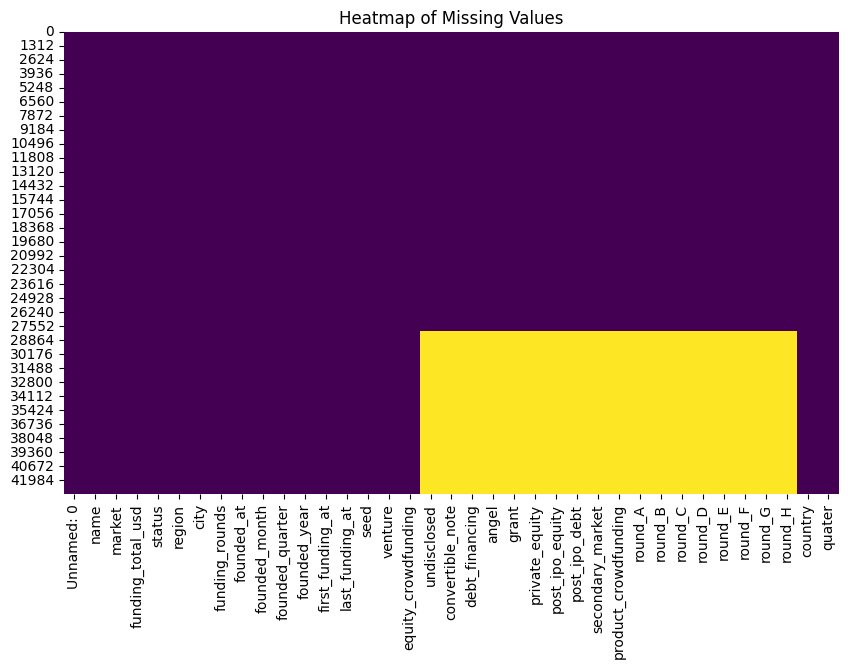

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title('Heatmap of Missing Values')
plt.show()

In [7]:
# As we see the status in in-balanced we are going to SMOTE that.
df['status'].value_counts(normalize=True)

status
operating    0.555561
acquired     0.222220
closed       0.222220
Name: proportion, dtype: float64

In [8]:
df['first_funding_at'] = pd.to_datetime(df['first_funding_at'], errors='coerce')
df['last_funding_at'] = pd.to_datetime(df['last_funding_at'], errors='coerce')
df['founded_at'] = pd.to_datetime(df['founded_at'],  errors='coerce')

###Feature Engineering

In [9]:
df['funding_category'] = df.apply(
    lambda x: 'Single Round - Traditional' if x['funding_rounds'] == 1 and x[['seed', 'venture']].sum() == 0
    else 'Single Round - Non-traditional' if x['funding_rounds'] == 1 and x[['seed', 'venture']].sum() > 0
    else 'Multiple Rounds', axis=1
)

In [10]:
current_year = datetime.now().year
df['company_age'] = current_year - df['founded_at'].dt.year

Remove unnecessary features for Peaklytics, as well as features that have high correlation with others.

In [11]:
df.drop(columns=['Unnamed: 0','round_G', 'round_H', 'founded_quarter', 'quater', 'founded_month', 'name', 'founded_year', 'founded_at', 'debt_financing', 'first_funding_at',	'last_funding_at'], inplace=True)

In [12]:

df['status']  = df['status'].apply(lambda x: 'operating' if x == 'acquired' else x)


In [13]:
df['status'].value_counts()

status
operating    33653
closed        9615
Name: count, dtype: int64

Save the cleaned data to a new csv file

In [14]:
df.to_csv('cleaned_peaklytics_data.csv', index=False)

# Preprocessing

In [15]:
cleaned_df = pd.read_csv('cleaned_peaklytics_data.csv')

In [16]:
cleaned_df.head()
cleaned_df.columns

Index(['market', 'funding_total_usd', 'status', 'region', 'city',
       'funding_rounds', 'seed', 'venture', 'equity_crowdfunding',
       'undisclosed', 'convertible_note', 'angel', 'grant', 'private_equity',
       'post_ipo_equity', 'post_ipo_debt', 'secondary_market',
       'product_crowdfunding', 'round_A', 'round_B', 'round_C', 'round_D',
       'round_E', 'round_F', 'country', 'funding_category', 'company_age'],
      dtype='object')

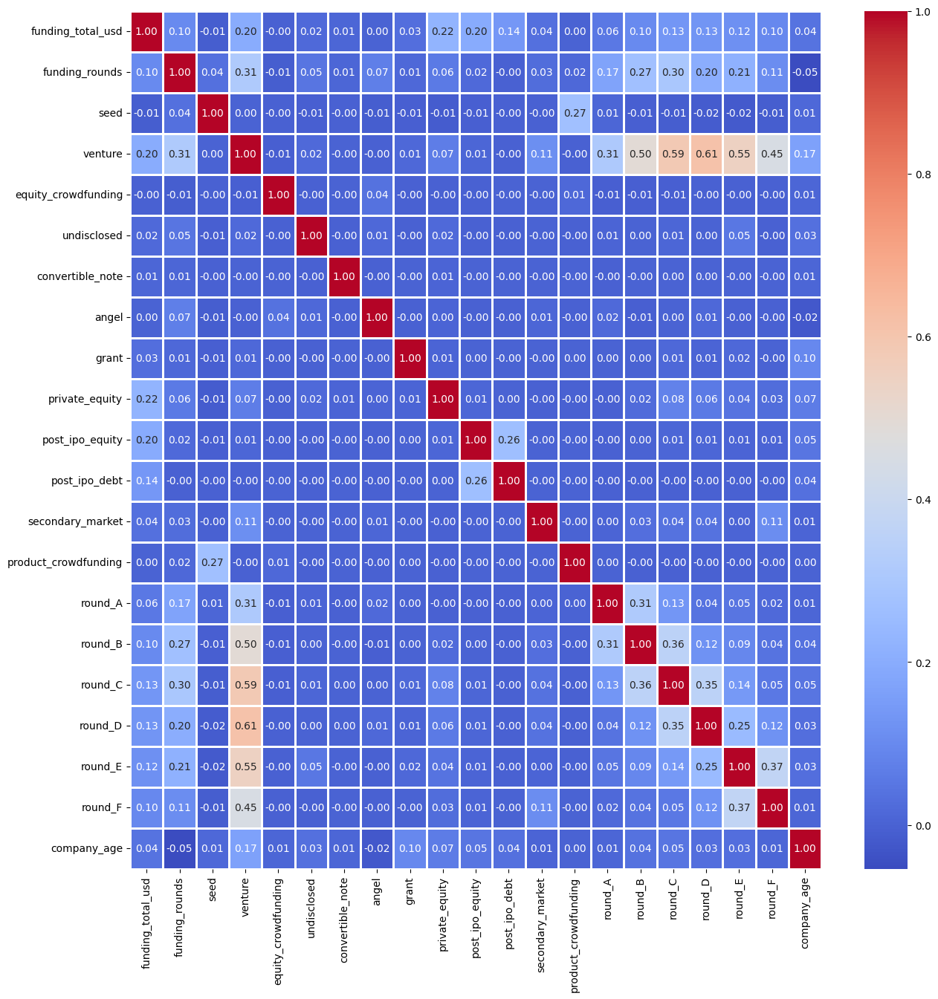

In [17]:
numerical_columns = cleaned_df.select_dtypes(include=['number']).columns

corr_matrix = cleaned_df[numerical_columns].corr()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.8, fmt='.2f', ax=ax)
plt.show()

In [18]:
missing_percentage = (cleaned_df.isnull().sum() / df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

private_equity          35.356383
undisclosed             35.356383
post_ipo_debt           35.356383
post_ipo_equity         35.356383
round_A                 35.356383
grant                   35.356383
angel                   35.356383
convertible_note        35.356383
round_B                 35.356383
product_crowdfunding    35.356383
round_C                 35.356383
round_D                 35.356383
round_E                 35.356383
round_F                 35.356383
secondary_market        35.356383
country                  0.000000
funding_category         0.000000
market                   0.000000
funding_total_usd        0.000000
equity_crowdfunding      0.000000
venture                  0.000000
seed                     0.000000
funding_rounds           0.000000
city                     0.000000
region                   0.000000
status                   0.000000
company_age              0.000000
dtype: float64


In [19]:
cleaned_df.dropna(inplace=True)

In [20]:
missing_percentage = (cleaned_df.isnull().sum() / cleaned_df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

market                  0.0
post_ipo_equity         0.0
funding_category        0.0
country                 0.0
round_F                 0.0
round_E                 0.0
round_D                 0.0
round_C                 0.0
round_B                 0.0
round_A                 0.0
product_crowdfunding    0.0
secondary_market        0.0
post_ipo_debt           0.0
private_equity          0.0
funding_total_usd       0.0
grant                   0.0
angel                   0.0
convertible_note        0.0
undisclosed             0.0
equity_crowdfunding     0.0
venture                 0.0
seed                    0.0
funding_rounds          0.0
city                    0.0
region                  0.0
status                  0.0
company_age             0.0
dtype: float64


## Removing outliers, scaling, encoding, and imputing

In [21]:
numerical_columns = cleaned_df.select_dtypes(include=['number']).columns
numerical_columns

Index(['funding_total_usd', 'funding_rounds', 'seed', 'venture',
       'equity_crowdfunding', 'undisclosed', 'convertible_note', 'angel',
       'grant', 'private_equity', 'post_ipo_equity', 'post_ipo_debt',
       'secondary_market', 'product_crowdfunding', 'round_A', 'round_B',
       'round_C', 'round_D', 'round_E', 'round_F', 'company_age'],
      dtype='object')

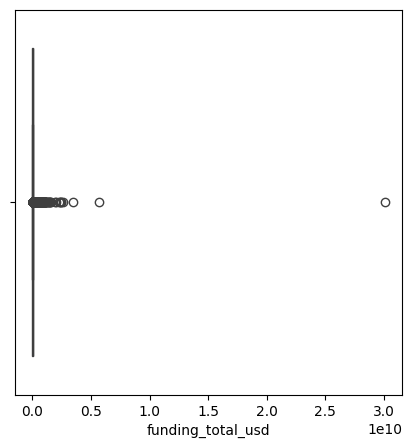

In [22]:
fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(x='funding_total_usd', data=cleaned_df, ax=ax)
plt.show()

In [23]:
# https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/

Q1 = cleaned_df['funding_total_usd'].quantile(0.25)
Q3 = cleaned_df['funding_total_usd'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.25 * IQR
upper_bound = Q3 + 1.25 * IQR

cleaned_df = cleaned_df[(cleaned_df['funding_total_usd'] >= lower_bound) & (cleaned_df['funding_total_usd'] <= upper_bound)]

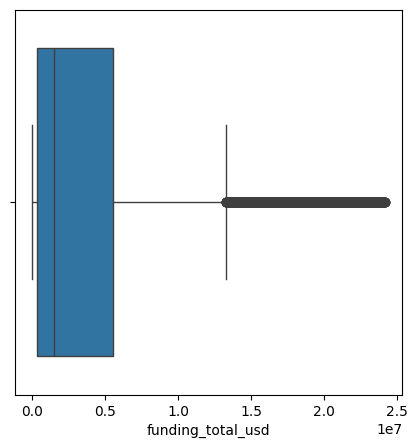

In [24]:
fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(x='funding_total_usd', data=cleaned_df, ax=ax)
plt.show()

In [25]:
duplicates_before = cleaned_df.duplicated().sum()
print(duplicates_before)
cleaned_df.drop_duplicates(inplace=True)

58


In [26]:
duplicates_after = cleaned_df.duplicated().sum()
print(duplicates_after)

0


In [27]:
cleaned_df[['market', 'country', 'funding_category', 'city', 'region']].nunique()

market               678
country              103
funding_category       3
city                2810
region               863
dtype: int64

In [28]:
cleaned_df = pd.get_dummies(cleaned_df, columns=['funding_category', 'country'], drop_first=True)
cleaned_df.head()

,market,funding_total_usd,status,region,city,funding_rounds,seed,venture,equity_crowdfunding,undisclosed,...,country_Tunisia,country_Turkey,country_Uganda,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Viet Nam
0,News,1750000.0,operating,New York City,New York,1.0,1750000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,True,False,False,False
1,Publishing,40000.0,operating,Tallinn,Tallinn,1.0,40000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
2,Electronics,1500000.0,operating,London,London,1.0,1500000.0,0.0,0.0,0.0,...,False,False,False,False,False,True,False,False,False,False
3,Tourism,60000.0,operating,Dallas,Fort Worth,2.0,0.0,0.0,60000.0,0.0,...,False,False,False,False,False,False,True,False,False,False
4,E-Commerce,40000.0,operating,Santiago,Las Condes,1.0,40000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False


In [29]:
market_freq = cleaned_df['market'].value_counts(normalize=True)
cleaned_df['market_freq'] = cleaned_df['market'].map(market_freq)

city_freq = cleaned_df['city'].value_counts(normalize=True)
cleaned_df['city_freq'] = cleaned_df['city'].map(city_freq)

region_freq = cleaned_df['region'].value_counts(normalize=True)
cleaned_df['region_freq'] = cleaned_df['region'].map(region_freq)

cleaned_df = cleaned_df.drop(columns=['market', 'city', 'region'])
cleaned_df.head()

,funding_total_usd,status,funding_rounds,seed,venture,equity_crowdfunding,undisclosed,convertible_note,angel,grant,...,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Viet Nam,market_freq,city_freq,region_freq
0,1750000.0,operating,1.0,1750000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,True,False,False,False,0.007591,0.061900,0.068442
1,40000.0,operating,1.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,0.001678,0.001090,0.001090
2,1500000.0,operating,1.0,1500000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,True,False,False,False,False,0.000755,0.033256,0.040134
3,60000.0,operating,2.0,0.0,0.0,60000.0,0.0,0.0,0.0,0.0,...,False,False,False,True,False,False,False,0.000545,0.000419,0.009688
4,40000.0,operating,1.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,0.036234,0.000084,0.004991


In [30]:
le = LabelEncoder()
cleaned_df['status'] = le.fit_transform(cleaned_df['status'])

In [43]:
import joblib
import pandas as pd

# Assuming you have the preprocessing done, save encoders and mappings
le = LabelEncoder()
cleaned_df['status'] = le.fit_transform(cleaned_df['status'])

# Save label encoder for 'status'
joblib.dump(le, 'status_encoder.pkl')

joblib.dump(market_freq, 'market_freq.pkl')
joblib.dump(city_freq, 'city_freq.pkl')
joblib.dump(region_freq, 'region_freq.pkl')


['region_freq.pkl']

In [31]:
cleaned_df.shape

(23845, 129)

In [32]:
total_null_values = cleaned_df.isnull().sum().sum()
print(f"Total null values: {total_null_values}")

Total null values: 0


In [33]:
cleaned_df.columns

Index(['funding_total_usd', 'status', 'funding_rounds', 'seed', 'venture',
       'equity_crowdfunding', 'undisclosed', 'convertible_note', 'angel',
       'grant',
       ...
       'country_Ukraine', 'country_United Arab Emirates',
       'country_United Kingdom', 'country_United States', 'country_Uruguay',
       'country_Uzbekistan', 'country_Viet Nam', 'market_freq', 'city_freq',
       'region_freq'],
      dtype='object', length=129)

##Handle imbalanced data, Splitting the data.

In [44]:
X = cleaned_df.drop(columns=['status'])
y = cleaned_df['status']

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Further split the resampled data into training and validation sets for validating
X_train, X_val, y_train, y_val = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, random_state=42)

# Initialize the StandardScaler
scaler = StandardScaler()

# Scale numerical columns for training, validation, and test sets after splitting for sure ( Data leackage )
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])
X_val[numerical_columns] = scaler.transform(X_val[numerical_columns])
X_test[numerical_columns] = scaler.transform(X_test[numerical_columns])
joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']

In [35]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


baseline_model = DummyClassifier(strategy='stratified')
baseline_model.fit(X_train_resampled, y_train_resampled)

y_pred_baseline = baseline_model.predict(X_test)


accuracy_baseline = accuracy_score(y_test, y_pred_baseline)
precision_baseline = precision_score(y_test, y_pred_baseline, average='weighted')
recall_baseline = recall_score(y_test, y_pred_baseline, average='weighted')
f1_baseline = f1_score(y_test, y_pred_baseline, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred_baseline)


print(f"Baseline Accuracy: {accuracy_baseline}")
print(f"Baseline Precision: {precision_baseline}")
print(f"Baseline Recall: {recall_baseline}")
print(f"Baseline F1 Score: {f1_baseline}")
print("Confusion Matrix:")
print(conf_matrix)

Baseline Accuracy: 0.5036695323967288
Baseline Precision: 0.8958171028385522
Baseline Recall: 0.503669532396729
Baseline F1 Score: 0.6260714097270008
Confusion Matrix:
[[ 135  131]
 [2236 2267]]




---



1. Hyperparameter Tuning: Use Optuna with cross-validation to find the best hyperparameters.
2. Model Training: Train the model using the best hyperparameters and early stopping with a validation set.
3. Model Evaluation: Evaluate the model on the test set to get final performance metrics.

In [36]:
# Clean up column names for both train and test sets
X_train_resampled.columns = X_train_resampled.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_test.columns = X_test.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)

# Objective function for Optuna
def objective(trial):
    param = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'num_leaves': trial.suggest_int('num_leaves', 20, 50),
        'min_child_samples': trial.suggest_int('min_child_samples', 20, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 0.9),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 0.9),
        'reg_alpha': trial.suggest_float('reg_alpha', 1, 10.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 1, 10.0),
        'drop_rate': trial.suggest_float('drop_rate', 0.2, 0.4),
        'max_drop': trial.suggest_int('max_drop', 5, 30),
        'random_state': 45
    }

    # Initialize the model with the suggested parameters
    lgbm_model = LGBMClassifier(**param)

    # Perform cross-validation to evaluate the model's performance
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    f1 = cross_val_score(lgbm_model, X_train_resampled, y_train_resampled, cv=cv, scoring='f1', n_jobs=-1).mean()

    return f1

# Optimize hyperparameters using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Best hyperparameters found by Optuna
best_params = study.best_params
print("Best hyperparameters found by Optuna:", best_params)

# Train the model with the best parameters
lgbm_model = LGBMClassifier(**best_params)

[I 2024-10-20 10:35:13,269] A new study created in memory with name: no-name-fff973cc-724e-4168-b169-b32e6f286991


[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3606
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 53
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014116 seconds.
You can set `force_col_wis

[I 2024-10-20 10:35:17,304] Trial 0 finished with value: 0.9305562469719426 and parameters: {'learning_rate': 0.09918264924891274, 'n_estimators': 156, 'max_depth': 4, 'num_leaves': 22, 'min_child_samples': 75, 'subsample': 0.847291463123854, 'colsample_bytree': 0.7577521274507899, 'reg_alpha': 1.9154191688434363, 'reg_lambda': 2.6054986337921013, 'drop_rate': 0.37330844504564953, 'max_drop': 30}. Best is trial 0 with value: 0.9305562469719426.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:35:21,534] Trial 1 finished with value: 0.945327658758975 and parameters: {'learning_rate': 0.05332601003582226, 'n_estimators': 329, 'max_depth': 6, 'num_leaves': 29, 'min_child_samples': 73, 'subsample': 0.7288104800516165, 'colsample_bytree': 0.6991425712253727, 'reg_alpha': 8.274197497966743, 'reg_lambda': 7.698746087904359, 'drop_rate': 0.24039123536044088, 'max_drop': 7}. Best is trial 1 with value: 0.945327658758975.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:35:23,100] Trial 2 finished with value: 0.8754990786681779 and parameters: {'learning_rate': 0.0262774234877109, 'n_estimators': 258, 'max_depth': 3, 'num_leaves': 50, 'min_child_samples': 81, 'subsample': 0.8209094804472592, 'colsample_bytree': 0.6758078486254334, 'reg_alpha': 5.579022905465171, 'reg_lambda': 7.425686899000542, 'drop_rate': 0.3809244176743934, 'max_drop': 17}. Best is trial 1 with value: 0.945327658758975.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:35:26,311] Trial 3 finished with value: 0.9526718243619682 and parameters: {'learning_rate': 0.09421909383369527, 'n_estimators': 255, 'max_depth': 6, 'num_leaves': 32, 'min_child_samples': 39, 'subsample': 0.6526936173764881, 'colsample_bytree': 0.8247920261494633, 'reg_alpha': 2.6800895836506173, 'reg_lambda': 6.087972771949704, 'drop_rate': 0.2725661802251637, 'max_drop': 17}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3582
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 52
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3602
[LightGBM] [Info] Number of data poi

[I 2024-10-20 10:35:30,349] Trial 4 finished with value: 0.9415529358713066 and parameters: {'learning_rate': 0.04272856436675144, 'n_estimators': 460, 'max_depth': 5, 'num_leaves': 32, 'min_child_samples': 83, 'subsample': 0.8160173893485706, 'colsample_bytree': 0.8730549094275935, 'reg_alpha': 3.412929083272807, 'reg_lambda': 5.2058166017546785, 'drop_rate': 0.23325047031441992, 'max_drop': 13}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3584
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-10-20 10:35:33,273] Trial 5 finished with value: 0.9481092763359579 and parameters: {'learning_rate': 0.09071175610850869, 'n_estimators': 456, 'max_depth': 4, 'num_leaves': 20, 'min_child_samples': 80, 'subsample': 0.6596496001577608, 'colsample_bytree': 0.7288159381096908, 'reg_alpha': 6.683611830913147, 'reg_lambda': 6.530074572254298, 'drop_rate': 0.39239452672892183, 'max_drop': 27}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:35:35,037] Trial 6 finished with value: 0.8830688533565624 and parameters: {'learning_rate': 0.024351810365397568, 'n_estimators': 319, 'max_depth': 3, 'num_leaves': 22, 'min_child_samples': 32, 'subsample': 0.6463514299371965, 'colsample_bytree': 0.705384425942579, 'reg_alpha': 8.852301008119417, 'reg_lambda': 2.168327699864258, 'drop_rate': 0.20959481979265904, 'max_drop': 28}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3586
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 54
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead 

[I 2024-10-20 10:35:36,925] Trial 7 finished with value: 0.9074019909868019 and parameters: {'learning_rate': 0.04270337350337996, 'n_estimators': 374, 'max_depth': 3, 'num_leaves': 30, 'min_child_samples': 73, 'subsample': 0.7919664448531911, 'colsample_bytree': 0.7359209921983494, 'reg_alpha': 6.6441363636423905, 'reg_lambda': 6.499183724447528, 'drop_rate': 0.2278245661876345, 'max_drop': 22}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:35:40,100] Trial 8 finished with value: 0.9158313067273764 and parameters: {'learning_rate': 0.027702684670308536, 'n_estimators': 294, 'max_depth': 5, 'num_leaves': 35, 'min_child_samples': 73, 'subsample': 0.7273869613937802, 'colsample_bytree': 0.8908464719960996, 'reg_alpha': 4.415263854302158, 'reg_lambda': 2.8513225799169204, 'drop_rate': 0.3712754093288314, 'max_drop': 30}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3588
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 55
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 55
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500017 -> initscore=0.000069
[Li

[I 2024-10-20 10:35:43,747] Trial 9 finished with value: 0.8991459916165526 and parameters: {'learning_rate': 0.01845651770336061, 'n_estimators': 284, 'max_depth': 5, 'num_leaves': 46, 'min_child_samples': 70, 'subsample': 0.8200209348637206, 'colsample_bytree': 0.7969994936933107, 'reg_alpha': 1.383262856991779, 'reg_lambda': 7.495803458380132, 'drop_rate': 0.36841205337701277, 'max_drop': 27}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3637
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-10-20 10:35:46,017] Trial 10 finished with value: 0.9324152266259207 and parameters: {'learning_rate': 0.07860751219109147, 'n_estimators': 111, 'max_depth': 6, 'num_leaves': 41, 'min_child_samples': 40, 'subsample': 0.6027069435018033, 'colsample_bytree': 0.6307823731423505, 'reg_alpha': 3.2514721685210723, 'reg_lambda': 9.658814892693233, 'drop_rate': 0.2901710008633165, 'max_drop': 10}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3548
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2024-10-20 10:35:49,407] Trial 11 finished with value: 0.9509281680370962 and parameters: {'learning_rate': 0.09961709063653612, 'n_estimators': 487, 'max_depth': 4, 'num_leaves': 26, 'min_child_samples': 98, 'subsample': 0.6689993899119278, 'colsample_bytree': 0.8180038004384634, 'reg_alpha': 7.001606251161753, 'reg_lambda': 4.951196618433733, 'drop_rate': 0.31452209021637895, 'max_drop': 21}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:35:51,095] Trial 12 finished with value: 0.9295276434737672 and parameters: {'learning_rate': 0.07630333936243844, 'n_estimators': 220, 'max_depth': 4, 'num_leaves': 26, 'min_child_samples': 100, 'subsample': 0.6757819882028863, 'colsample_bytree': 0.8248275151242158, 'reg_alpha': 6.9130455831072055, 'reg_lambda': 4.163611125582401, 'drop_rate': 0.3037787723527322, 'max_drop': 20}. Best is trial 3 with value: 0.9526718243619682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:35:56,717] Trial 13 finished with value: 0.9529774747181294 and parameters: {'learning_rate': 0.0761817845746371, 'n_estimators': 411, 'max_depth': 6, 'num_leaves': 39, 'min_child_samples': 48, 'subsample': 0.6063355113774871, 'colsample_bytree': 0.8285499440618111, 'reg_alpha': 9.986780783738013, 'reg_lambda': 4.441589034898446, 'drop_rate': 0.29603909867393846, 'max_drop': 16}. Best is trial 13 with value: 0.9529774747181294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of p

[I 2024-10-20 10:36:01,474] Trial 14 finished with value: 0.9525619655145885 and parameters: {'learning_rate': 0.0769307627557407, 'n_estimators': 371, 'max_depth': 6, 'num_leaves': 40, 'min_child_samples': 48, 'subsample': 0.6002544286645245, 'colsample_bytree': 0.8462159882134639, 'reg_alpha': 9.806880971186931, 'reg_lambda': 4.079548628190048, 'drop_rate': 0.2693258745055913, 'max_drop': 16}. Best is trial 13 with value: 0.9529774747181294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3673
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000

[I 2024-10-20 10:36:06,564] Trial 15 finished with value: 0.9575263329199908 and parameters: {'learning_rate': 0.06368047033437889, 'n_estimators': 405, 'max_depth': 6, 'num_leaves': 38, 'min_child_samples': 20, 'subsample': 0.8992007726434236, 'colsample_bytree': 0.7842778458698729, 'reg_alpha': 2.915433868103435, 'reg_lambda': 1.4095327404257878, 'drop_rate': 0.3265132875792628, 'max_drop': 13}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3673
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3695
[LightGBM] [Info] Number 

[I 2024-10-20 10:36:10,925] Trial 16 finished with value: 0.9526273384599608 and parameters: {'learning_rate': 0.06417884528156062, 'n_estimators': 408, 'max_depth': 5, 'num_leaves': 40, 'min_child_samples': 20, 'subsample': 0.8990040308311059, 'colsample_bytree': 0.7740155082564313, 'reg_alpha': 4.822771033717967, 'reg_lambda': 1.1267250019676796, 'drop_rate': 0.33132239042410244, 'max_drop': 12}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:36:16,716] Trial 17 finished with value: 0.9523828048665519 and parameters: {'learning_rate': 0.06372070097039816, 'n_estimators': 417, 'max_depth': 6, 'num_leaves': 37, 'min_child_samples': 55, 'subsample': 0.8891771441511296, 'colsample_bytree': 0.7889808848923, 'reg_alpha': 9.926558716617187, 'reg_lambda': 1.5181622952701768, 'drop_rate': 0.32628774702626806, 'max_drop': 6}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:36:22,348] Trial 18 finished with value: 0.9537286121239779 and parameters: {'learning_rate': 0.06283743476098984, 'n_estimators': 378, 'max_depth': 6, 'num_leaves': 45, 'min_child_samples': 25, 'subsample': 0.7706749932927298, 'colsample_bytree': 0.8575380041802438, 'reg_alpha': 4.313881093670119, 'reg_lambda': 3.477073010717263, 'drop_rate': 0.34573147125938725, 'max_drop': 14}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[I 2024-10-20 10:36:26,582] Trial 19 finished with value: 0.9443615691938045 and parameters: {'learning_rate': 0.05273335495348237, 'n_estimators': 349, 'max_depth': 5, 'num_leaves': 45, 'min_child_samples': 20, 'subsample': 0.7767806878477027, 'colsample_bytree': 0.8690724536848332, 'reg_alpha': 4.17029899034217, 'reg_lambda': 3.508095245201389, 'drop_rate': 0.35223765769071275, 'max_drop': 9}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:36:33,549] Trial 20 finished with value: 0.9506449218368005 and parameters: {'learning_rate': 0.04080060567017118, 'n_estimators': 496, 'max_depth': 6, 'num_leaves': 45, 'min_child_samples': 29, 'subsample': 0.8486313839673729, 'colsample_bytree': 0.8974887541041833, 'reg_alpha': 5.61244270280082, 'reg_lambda': 1.921871446186324, 'drop_rate': 0.35106591991369634, 'max_drop': 14}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3647
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 70
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3679
[LightGBM] [Info] Number of data poi

[I 2024-10-20 10:36:38,419] Trial 21 finished with value: 0.9565063262732847 and parameters: {'learning_rate': 0.06545571763263033, 'n_estimators': 418, 'max_depth': 6, 'num_leaves': 37, 'min_child_samples': 30, 'subsample': 0.7045892337316466, 'colsample_bytree': 0.8480472855816354, 'reg_alpha': 2.438280780333032, 'reg_lambda': 3.216208068835669, 'drop_rate': 0.34092246848586805, 'max_drop': 15}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3649
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 71
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3683
[LightGBM] [Info] Number of data poi

[I 2024-10-20 10:36:44,213] Trial 22 finished with value: 0.9561945472817716 and parameters: {'learning_rate': 0.061245456860513484, 'n_estimators': 438, 'max_depth': 6, 'num_leaves': 43, 'min_child_samples': 28, 'subsample': 0.7069899364537521, 'colsample_bytree': 0.8532670879524913, 'reg_alpha': 2.34122481939136, 'reg_lambda': 3.4514600286218564, 'drop_rate': 0.34533474440674855, 'max_drop': 11}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3637
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010962 seconds.
You can set `force_row_wise=true` to remov

[I 2024-10-20 10:36:49,289] Trial 23 finished with value: 0.9530049091763683 and parameters: {'learning_rate': 0.06958174979161291, 'n_estimators': 444, 'max_depth': 5, 'num_leaves': 42, 'min_child_samples': 36, 'subsample': 0.705668164588836, 'colsample_bytree': 0.7940205579840499, 'reg_alpha': 2.248265567983806, 'reg_lambda': 2.99873429239723, 'drop_rate': 0.3344893212427636, 'max_drop': 11}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3647
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 70
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Total Bins 3683
[LightGBM] [Info] Number of data poi

[I 2024-10-20 10:36:55,208] Trial 24 finished with value: 0.9555812907078884 and parameters: {'learning_rate': 0.05518341074842216, 'n_estimators': 439, 'max_depth': 6, 'num_leaves': 36, 'min_child_samples': 29, 'subsample': 0.7051599900240769, 'colsample_bytree': 0.8422354999769929, 'reg_alpha': 1.5151976614787004, 'reg_lambda': 1.9864334068573153, 'drop_rate': 0.3159627598323437, 'max_drop': 8}. Best is trial 15 with value: 0.9575263329199908.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3616
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 61
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-10-20 10:36:59,801] Trial 25 finished with value: 0.9588557459378674 and parameters: {'learning_rate': 0.08662642374325635, 'n_estimators': 401, 'max_depth': 6, 'num_leaves': 48, 'min_child_samples': 46, 'subsample': 0.7460118659457423, 'colsample_bytree': 0.8033440908391855, 'reg_alpha': 1.0347244868635168, 'reg_lambda': 3.5102972947395883, 'drop_rate': 0.35355610879409494, 'max_drop': 5}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:37:03,390] Trial 26 finished with value: 0.9562582049173143 and parameters: {'learning_rate': 0.09138389761161061, 'n_estimators': 388, 'max_depth': 5, 'num_leaves': 50, 'min_child_samples': 46, 'subsample': 0.7483210185403159, 'colsample_bytree': 0.7739410092701982, 'reg_alpha': 1.1365290170284286, 'reg_lambda': 1.3959032745695144, 'drop_rate': 0.39667605367089714, 'max_drop': 5}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:37:07,828] Trial 27 finished with value: 0.95619118103703 and parameters: {'learning_rate': 0.08209076004022196, 'n_estimators': 349, 'max_depth': 6, 'num_leaves': 38, 'min_child_samples': 57, 'subsample': 0.7511172094074342, 'colsample_bytree': 0.8048072585792624, 'reg_alpha': 3.511766264594379, 'reg_lambda': 2.4519698137013695, 'drop_rate': 0.35350797816997337, 'max_drop': 19}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:37:11,820] Trial 28 finished with value: 0.9493423395411507 and parameters: {'learning_rate': 0.07042022983085482, 'n_estimators': 401, 'max_depth': 5, 'num_leaves': 48, 'min_child_samples': 63, 'subsample': 0.8712788050581075, 'colsample_bytree': 0.7696108928106679, 'reg_alpha': 2.903852601908601, 'reg_lambda': 4.7826641392888645, 'drop_rate': 0.2804647564876436, 'max_drop': 23}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:37:14,815] Trial 29 finished with value: 0.9351631971223583 and parameters: {'learning_rate': 0.0488463145574599, 'n_estimators': 182, 'max_depth': 6, 'num_leaves': 32, 'min_child_samples': 34, 'subsample': 0.6814227665937608, 'colsample_bytree': 0.7391242996558001, 'reg_alpha': 1.820169404674949, 'reg_lambda': 2.792823640948962, 'drop_rate': 0.36262893624610587, 'max_drop': 24}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006193 seconds.


[I 2024-10-20 10:37:19,124] Trial 30 finished with value: 0.9570849445521545 and parameters: {'learning_rate': 0.08733213848178227, 'n_estimators': 344, 'max_depth': 6, 'num_leaves': 34, 'min_child_samples': 42, 'subsample': 0.7940588591455621, 'colsample_bytree': 0.7554240550996281, 'reg_alpha': 1.0355163710590585, 'reg_lambda': 3.8816483703727416, 'drop_rate': 0.3154039821949295, 'max_drop': 15}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3631
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 62
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3634
[LightGBM] [Info] Number of data poi

[I 2024-10-20 10:37:23,638] Trial 31 finished with value: 0.9564080770034451 and parameters: {'learning_rate': 0.08354249905066417, 'n_estimators': 348, 'max_depth': 6, 'num_leaves': 35, 'min_child_samples': 44, 'subsample': 0.7910535305178087, 'colsample_bytree': 0.7547383524049877, 'reg_alpha': 1.0823425787499446, 'reg_lambda': 3.6334083291792005, 'drop_rate': 0.3136852380469087, 'max_drop': 15}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3667
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 76
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-10-20 10:37:27,761] Trial 32 finished with value: 0.9564113425127461 and parameters: {'learning_rate': 0.0862129759108688, 'n_estimators': 320, 'max_depth': 6, 'num_leaves': 34, 'min_child_samples': 25, 'subsample': 0.8456270444403942, 'colsample_bytree': 0.7540965438856916, 'reg_alpha': 1.9720816551433102, 'reg_lambda': 3.8748650920282985, 'drop_rate': 0.33329064695272426, 'max_drop': 19}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017455 seconds.


[I 2024-10-20 10:37:33,674] Trial 33 finished with value: 0.9563005107136986 and parameters: {'learning_rate': 0.06963774293846338, 'n_estimators': 426, 'max_depth': 6, 'num_leaves': 30, 'min_child_samples': 51, 'subsample': 0.7283591145008816, 'colsample_bytree': 0.7162596556381916, 'reg_alpha': 1.8173585072077292, 'reg_lambda': 3.168127422429868, 'drop_rate': 0.3805797676936385, 'max_drop': 8}. Best is trial 25 with value: 0.9588557459378674.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010359 seconds.


[I 2024-10-20 10:37:39,832] Trial 34 finished with value: 0.9602567160788734 and parameters: {'learning_rate': 0.09447198664045987, 'n_estimators': 472, 'max_depth': 6, 'num_leaves': 27, 'min_child_samples': 39, 'subsample': 0.7580742887322155, 'colsample_bytree': 0.6038871931367393, 'reg_alpha': 2.857234635574815, 'reg_lambda': 5.769311885602035, 'drop_rate': 0.3052458192819666, 'max_drop': 18}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins

[I 2024-10-20 10:37:46,520] Trial 35 finished with value: 0.9595704753065576 and parameters: {'learning_rate': 0.09345841578706164, 'n_estimators': 482, 'max_depth': 6, 'num_leaves': 27, 'min_child_samples': 40, 'subsample': 0.7561816941229107, 'colsample_bytree': 0.646179075835755, 'reg_alpha': 2.937774875741388, 'reg_lambda': 5.720094392977603, 'drop_rate': 0.26180268534498485, 'max_drop': 17}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3590
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 56
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3612
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 56
[LightG

[I 2024-10-20 10:37:51,055] Trial 36 finished with value: 0.9559421840777619 and parameters: {'learning_rate': 0.09474007847233926, 'n_estimators': 463, 'max_depth': 5, 'num_leaves': 26, 'min_child_samples': 63, 'subsample': 0.7509637581562153, 'colsample_bytree': 0.6023766716741175, 'reg_alpha': 2.9964706377734576, 'reg_lambda': 5.945301926718029, 'drop_rate': 0.2487643343054416, 'max_drop': 18}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3660
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500017 -> initscore=0.000069
[LightGBM] [Info] Start training from score 0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true

[I 2024-10-20 10:37:56,688] Trial 37 finished with value: 0.9599191371611735 and parameters: {'learning_rate': 0.09842766803089181, 'n_estimators': 477, 'max_depth': 6, 'num_leaves': 24, 'min_child_samples': 39, 'subsample': 0.8418330143117799, 'colsample_bytree': 0.660348416257392, 'reg_alpha': 3.473532318355649, 'reg_lambda': 5.6922709007673085, 'drop_rate': 0.256616769469449, 'max_drop': 18}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3637
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, th

[I 2024-10-20 10:38:01,478] Trial 38 finished with value: 0.95570358860833 and parameters: {'learning_rate': 0.09487745989321907, 'n_estimators': 476, 'max_depth': 5, 'num_leaves': 22, 'min_child_samples': 38, 'subsample': 0.8330298539180618, 'colsample_bytree': 0.6679535322242176, 'reg_alpha': 5.389253082162356, 'reg_lambda': 5.546124951563204, 'drop_rate': 0.2577351309835574, 'max_drop': 25}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-10-20 10:38:06,687] Trial 39 finished with value: 0.9587347345354452 and parameters: {'learning_rate': 0.09758601118574127, 'n_estimators': 471, 'max_depth': 6, 'num_leaves': 24, 'min_child_samples': 53, 'subsample': 0.7656214106082234, 'colsample_bytree': 0.6578415703510514, 'reg_alpha': 3.7915938872569717, 'reg_lambda': 8.127048003218805, 'drop_rate': 0.22449817369860342, 'max_drop': 18}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[I 2024-10-20 10:38:11,154] Trial 40 finished with value: 0.9546499076060562 and parameters: {'learning_rate': 0.09027042800318956, 'n_estimators': 452, 'max_depth': 5, 'num_leaves': 28, 'min_child_samples': 38, 'subsample': 0.8072016212883801, 'colsample_bytree': 0.6329081127534285, 'reg_alpha': 3.758777700778942, 'reg_lambda': 6.967058446639186, 'drop_rate': 0.26480269785808996, 'max_drop': 21}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:38:16,517] Trial 41 finished with value: 0.9591565564994958 and parameters: {'learning_rate': 0.09903392244661505, 'n_estimators': 497, 'max_depth': 6, 'num_leaves': 20, 'min_child_samples': 52, 'subsample': 0.7709674817740361, 'colsample_bytree': 0.6775448191492399, 'reg_alpha': 3.637589340263625, 'reg_lambda': 8.229555409468404, 'drop_rate': 0.21611190627074084, 'max_drop': 17}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3633
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 63
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3634
[LightGBM] [Info] Number of data poi

[I 2024-10-20 10:38:21,818] Trial 42 finished with value: 0.9587969689246554 and parameters: {'learning_rate': 0.09928349213059032, 'n_estimators': 500, 'max_depth': 6, 'num_leaves': 20, 'min_child_samples': 43, 'subsample': 0.7366867723466568, 'colsample_bytree': 0.6855343527501854, 'reg_alpha': 4.613758814543348, 'reg_lambda': 8.489152860459619, 'drop_rate': 0.20025552128500634, 'max_drop': 17}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3612
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 59
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2024-10-20 10:38:24,730] Trial 43 finished with value: 0.9395000126843259 and parameters: {'learning_rate': 0.09076921621662848, 'n_estimators': 478, 'max_depth': 3, 'num_leaves': 22, 'min_child_samples': 50, 'subsample': 0.7600245247976063, 'colsample_bytree': 0.6067928593471952, 'reg_alpha': 5.2568134395429436, 'reg_lambda': 5.624330087507846, 'drop_rate': 0.24024797308312465, 'max_drop': 20}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:38:30,555] Trial 44 finished with value: 0.9580742595531369 and parameters: {'learning_rate': 0.09577297816417635, 'n_estimators': 463, 'max_depth': 6, 'num_leaves': 29, 'min_child_samples': 60, 'subsample': 0.779213283961642, 'colsample_bytree': 0.6439119513646144, 'reg_alpha': 6.117566369346077, 'reg_lambda': 6.669704956782614, 'drop_rate': 0.21726215730297832, 'max_drop': 22}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.079776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3637
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of t

[I 2024-10-20 10:38:37,067] Trial 45 finished with value: 0.9574318729178983 and parameters: {'learning_rate': 0.08674867474048352, 'n_estimators': 487, 'max_depth': 6, 'num_leaves': 24, 'min_child_samples': 40, 'subsample': 0.8105495271846035, 'colsample_bytree': 0.6183582228995453, 'reg_alpha': 3.8981457485571056, 'reg_lambda': 8.78406627300621, 'drop_rate': 0.2501846315651089, 'max_drop': 17}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:38:42,371] Trial 46 finished with value: 0.9575259306740399 and parameters: {'learning_rate': 0.08161272729496657, 'n_estimators': 452, 'max_depth': 6, 'num_leaves': 24, 'min_child_samples': 46, 'subsample': 0.7343810049571389, 'colsample_bytree': 0.687667205571358, 'reg_alpha': 2.6610807185745555, 'reg_lambda': 6.032897224667939, 'drop_rate': 0.2927948537122061, 'max_drop': 19}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-20 10:38:46,063] Trial 47 finished with value: 0.9521832288592773 and parameters: {'learning_rate': 0.09959017369969039, 'n_estimators': 499, 'max_depth': 4, 'num_leaves': 20, 'min_child_samples': 34, 'subsample': 0.7206787040204987, 'colsample_bytree': 0.66252167678345, 'reg_alpha': 3.2793290677052305, 'reg_lambda': 7.217273034931786, 'drop_rate': 0.28073023825573823, 'max_drop': 26}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3632
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] 

[I 2024-10-20 10:38:49,457] Trial 48 finished with value: 0.9527961730413066 and parameters: {'learning_rate': 0.09202791806647094, 'n_estimators': 259, 'max_depth': 6, 'num_leaves': 28, 'min_child_samples': 55, 'subsample': 0.8007312404012175, 'colsample_bytree': 0.6350540563440922, 'reg_alpha': 3.3711180828247103, 'reg_lambda': 5.103234653112205, 'drop_rate': 0.23854683972660554, 'max_drop': 30}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins

[I 2024-10-20 10:38:55,040] Trial 49 finished with value: 0.9554772969626187 and parameters: {'learning_rate': 0.08759069004801144, 'n_estimators': 431, 'max_depth': 6, 'num_leaves': 25, 'min_child_samples': 41, 'subsample': 0.7856366069829028, 'colsample_bytree': 0.7016937681685026, 'reg_alpha': 7.548114357702097, 'reg_lambda': 9.125607090291076, 'drop_rate': 0.2297151186949388, 'max_drop': 21}. Best is trial 34 with value: 0.9602567160788734.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Best hyperparameters found by Optuna: {'learning_rate': 0.09447198664045987, 'n_estimators': 472, 'max_depth': 6, 'num_leaves': 27, 'min_child_samples': 39, 'subsample': 0.7580742887322155, 'colsample_bytree': 0.6038871931367393, 'reg_alpha': 2.857234635574815, 'reg_lambda': 5.769311885602035, 'drop_rate': 0.3052458192819666, 'max_drop': 18}


[LightGBM] [Info] Number of positive: 14391, number of negative: 14410
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3631
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 64
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499670 -> initscore=-0.001319
[LightGBM] [Info] Start training from score -0.001319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

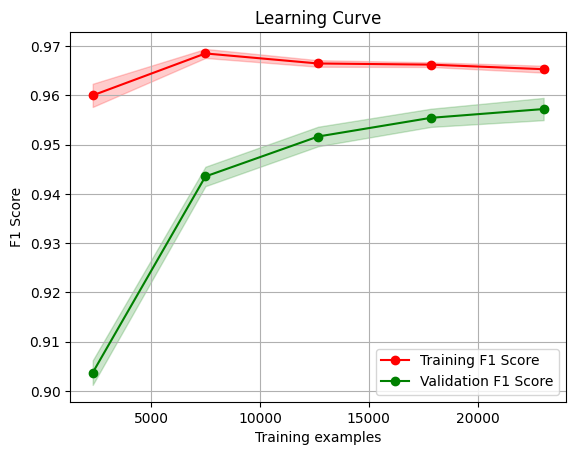

In [37]:
# Clean up column names for both train and test sets
X_train.columns = X_train.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_val.columns = X_val.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_test.columns = X_test.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)

lgbm_model.fit(X_train, y_train,
               eval_set=[(X_val, y_val)],
               eval_metric='f1',
               callbacks=[early_stopping(stopping_rounds=100), log_evaluation(50)])

# Evaluate the model
y_pred = lgbm_model.predict(X_test)
y_pred_proba = lgbm_model.predict_proba(X_test)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

print(f"Test Accuracy: {accuracy:.2f}")
print(f"Test F1 Score: {f1:.2f}")
print(f"Test ROC AUC Score: {roc_auc:.2f}")

# Plot learning curve
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_sizes, train_scores, val_scores = learning_curve(
    lgbm_model, X_train, y_train, cv=cv, scoring='f1', n_jobs=-1)

# Calculate mean and standard deviation for training and validation scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
val_std = np.std(val_scores, axis=1)

# Plot the learning curve
plt.figure()
plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training F1 Score')
plt.plot(train_sizes, val_mean, 'o-', color='g', label='Validation F1 Score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color='r', alpha=0.2)
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, color='g', alpha=0.2)

plt.title('Learning Curve')
plt.xlabel('Training examples')
plt.ylabel('F1 Score')
plt.legend(loc='best')
plt.grid()
plt.show()

In [38]:
# Save the trained model to a file
import pickle


with open('final_lgbm_model_2', 'wb') as file:
    pickle.dump(lgbm_model, file)

In [39]:
# Save the model using the LightGBM Booster
lgbm_model.booster_.save_model('lgbm_model.txt')


In [40]:
!pip install shap


Expected Value: -0.9668172061890246
SHAP Values Type: <class 'numpy.ndarray'>
SHAP Values Length: 4769


/Users/SHAD/.pyenv/versions/3.10.6/envs/peaklytics/lib/python3.10/site-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


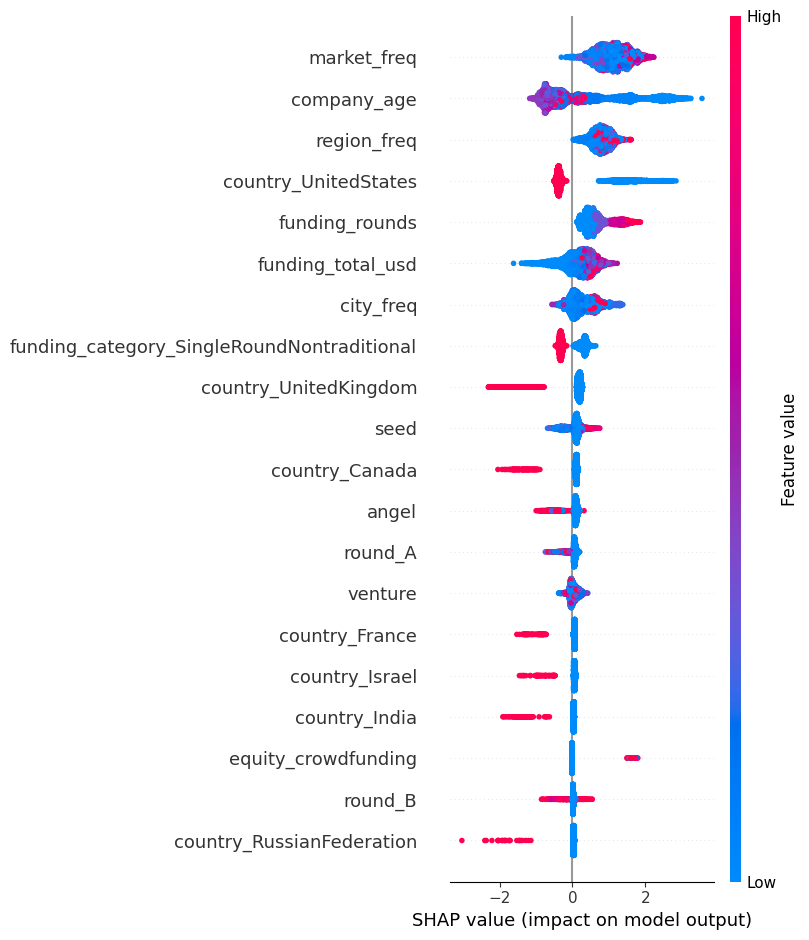

In [41]:
import shap

# Initialize the SHAP Tree explainer
explainer = shap.TreeExplainer(lgbm_model)
shap_values = explainer.shap_values(X_test)

# Check the structure of expected_value and shap_values
print("Expected Value:", explainer.expected_value)
print("SHAP Values Type:", type(shap_values))
print("SHAP Values Length:", len(shap_values))

# Access the SHAP values for the positive class
# Ensure that shap_values is a list and has the expected length
if isinstance(shap_values, list) and len(shap_values) > 1:
    shap_values_positive_class = shap_values[1]
else:
    shap_values_positive_class = shap_values  # Fallback if not a list

# Visualize the SHAP values for a single prediction
shap.initjs()
shap.force_plot(explainer.expected_value[1] if isinstance(explainer.expected_value, list) else explainer.expected_value,
                shap_values_positive_class[0], X_test.iloc[0])

# Summary plot for feature importance
shap.summary_plot(shap_values_positive_class, X_test)